In [1]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import tensorflow as tf
from glob import glob
from yolov3.yolov4_config import Create_Yolo
from yolov3.utils_config import load_yolo_weights, detect_image
from yolov3.configs_config import *
from PIL import Image

import os
import pandas as pd

if YOLO_TYPE == "yolov4":
    Darknet_weights = YOLO_V4_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V4_WEIGHTS
if YOLO_TYPE == "yolov3":
    Darknet_weights = YOLO_V3_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V3_WEIGHTS

yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE)
load_yolo_weights(yolo, Darknet_weights) # use Darknet weights

In [2]:
yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE, CLASSES=TRAIN_CLASSES)
yolo.load_weights("./checkpoints/frist/yolov3_custom") # use keras weights

# image path

In [3]:
tr = glob(r"teeth_including_lip_more\train/*.xml")
te = glob(r"teeth_including_lip_more\test/*.xml")
r5 = glob(r"C:\Users\NA_team_1\Desktop\test\*.jpg")

print("train data : {}".format(len(tr)))
print("validation data : {}".format(len(te)))
print("test data {}".format(len(r5)))

train data : 340
validation data : 85
test data 85


In [4]:
r1 = glob(r"teeth_including_lip_more\test/*.jpg")

In [5]:
r11 = glob(r"teeth_including_lip_more\train/*.jpg")

In [6]:
r2 =  glob(r"anomaly_data/*.jpg")

In [7]:
r3 =  glob(r"crop_anomaly/*.jpg")

In [8]:
r4 =  glob(r"use_image_poster\real_anomaly/*.jpg")

In [9]:
# # in dahun computer 
# coco_anomaly =  glob(r"C:\Users\NA_team2\TensorFlow-2.x-YOLOv3\TensorFlow-2.x-YOLOv3\val2017/*.jpg")

In [10]:
coco_anomaly =  glob(r"C:\Users\NA_team_1\Desktop\val2017\*.jpg")
np.random.seed(42)
a = np.random.randint(5000, size =76)
a = np.sort(a)
print(a)
anomaly_76 = [coco_anomaly[i] for i in a]

[  34  130  161  189  241  337  466  474  600  646  769  775  860  878
  975  995 1016 1021 1076 1082 1184 1267 1275 1363 1478 1500 1528 1585
 1685 1806 1899 1955 1981 2041 2047 2061 2363 2391 2433 2435 2556 2558
 2612 2613 2734 2747 2824 2888 2904 2919 3005 3073 3092 3152 3171 3202
 3342 3385 3444 3461 3556 3772 3798 3843 3890 3943 4014 4117 4297 4426
 4551 4555 4658 4798 4843 4911]


In [11]:
coco_center_crop = glob(r"C:\Users\NA_team_1\Desktop\coco_crop\*.jpg")

In [12]:
# braces =  glob(r"C:\Users\NA_team_1\Desktop\GitHub\TensorFlow-2.x-YOLOv3\braces/*.jpg")

In [13]:
brace_path = r"braces"

In [14]:
angled_path = r"angled"

# train

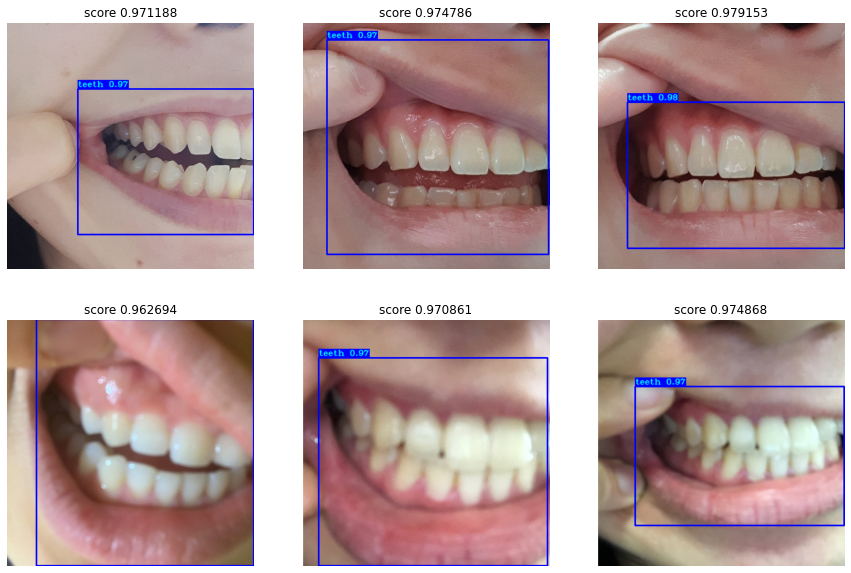

In [15]:
#plt.figure(figsize=(15,30))
#for i in range(18):
#    plt.subplot(6,3,i+1)
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# validation

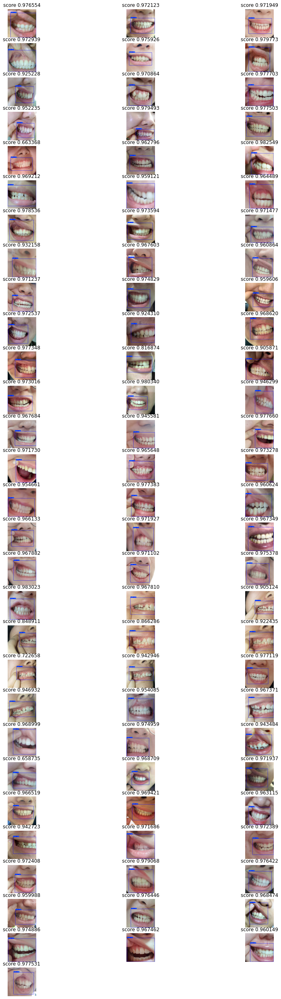

In [16]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

## test

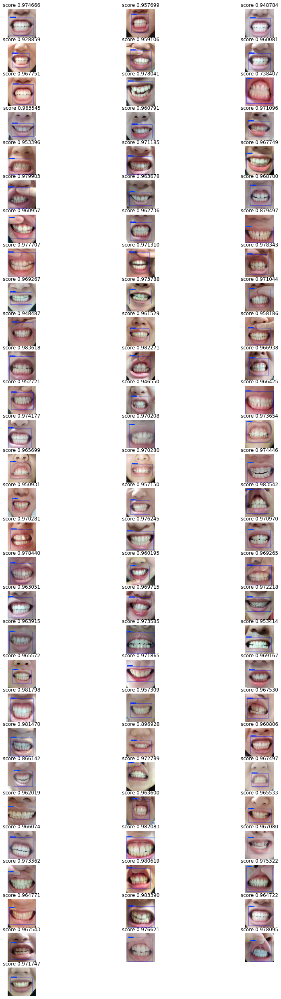

In [17]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# anomaly

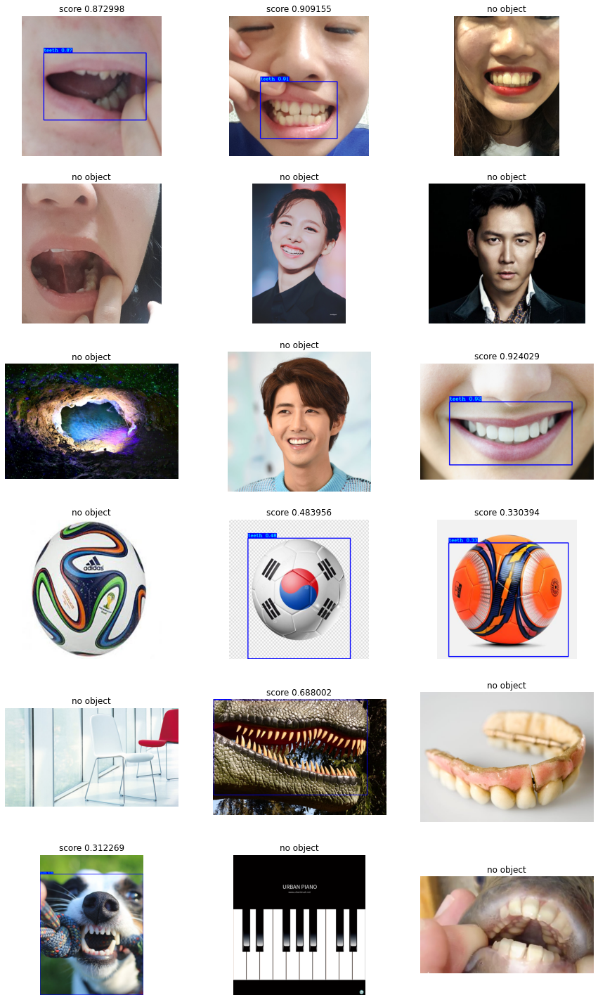

In [18]:
plt.figure(figsize=(15,30))
for i in range(18):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# crop anomaly

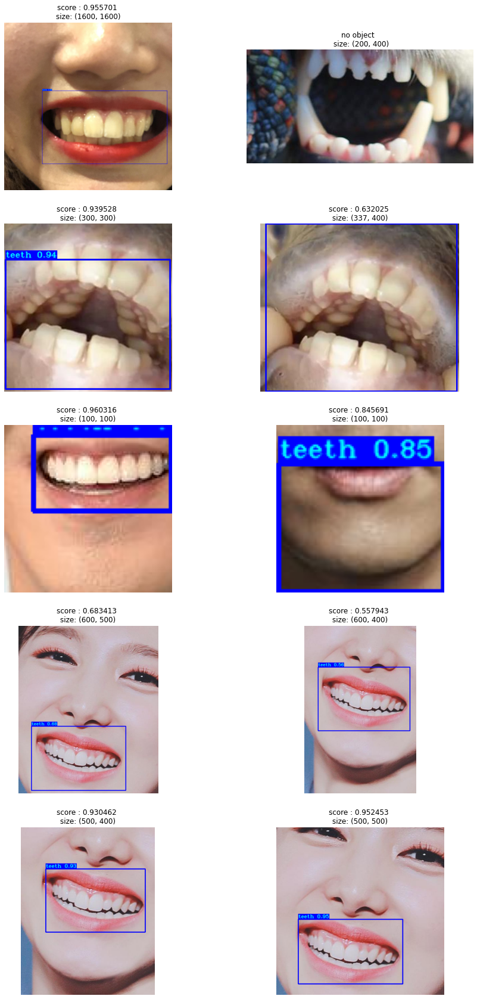

In [19]:
plt.figure(figsize=(15,30))
for i in range(len(r3)):
    plt.subplot(5,2,i+1)
    image, bboxes = detect_image(yolo, r3[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.5 , CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object  \n size: {}'.format(cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
    else :
        plt.title('score : {0:2f} \n size: {1} '.format(bboxes[0][4], cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
plt.show()

# coco 76

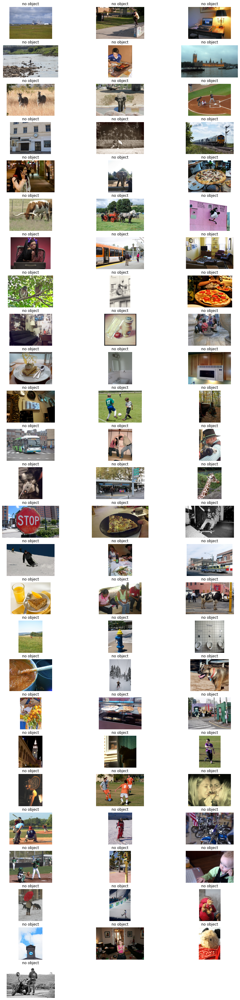

In [20]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, anomaly_76[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# coco 76 center crop

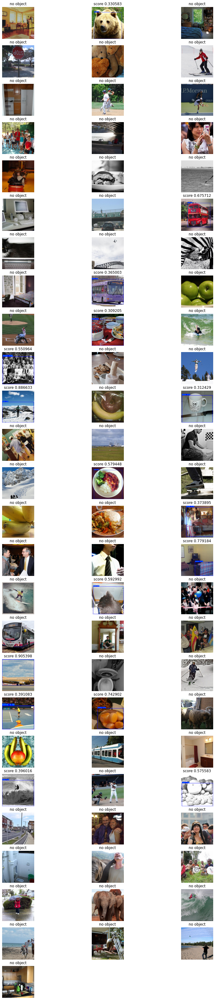

In [21]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# braces

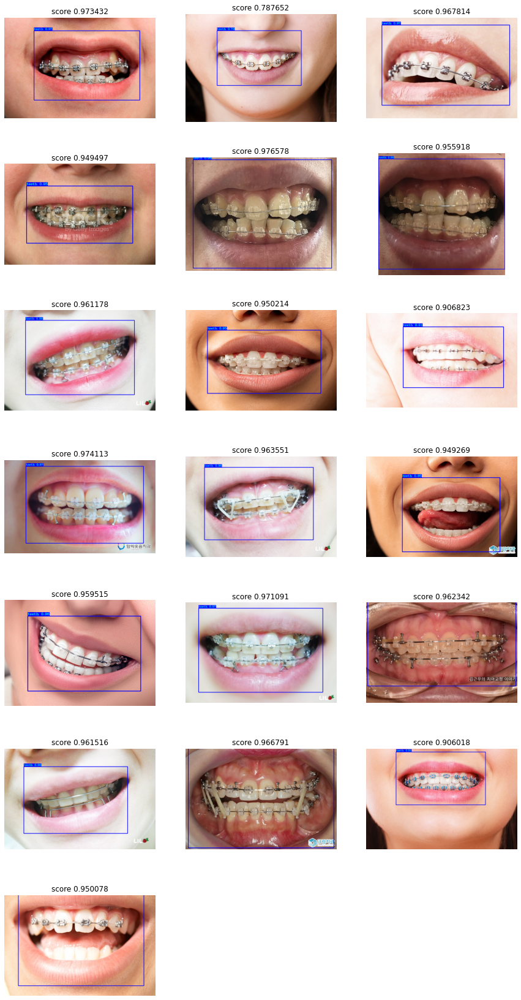

In [22]:
# it contain png files
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(brace_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# angle data

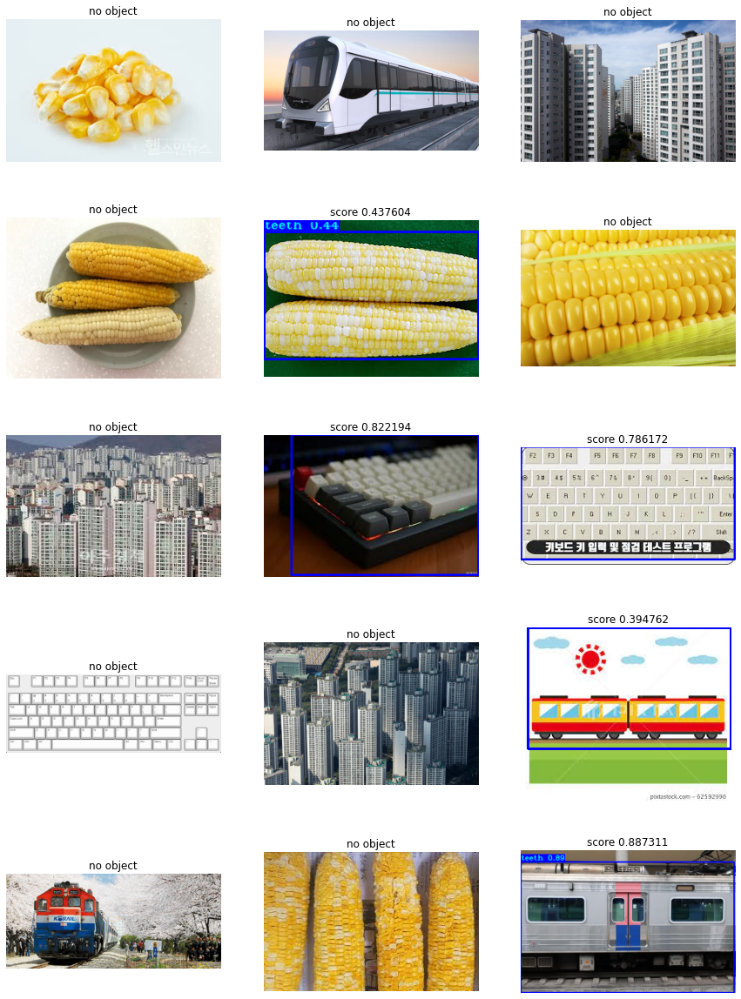

In [23]:
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(angled_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# score evaluate

In [24]:
train_score = [ ]
train_score_i = [ ]
valid_score = []
valid_score_i = []
anomaly_score = []
anomaly_i=[]
center_anomaly_score = []
center_anomaly_i = []

In [25]:
test_score = []
test_score_i = []

In [26]:
braces_score = []
braces_i=[]
angle_score = []
angle_i=[]

In [27]:
full_coco_anomaly_score = []
full_coco_anomaly_i=[]

In [28]:
full_coco_center_anomaly_score = []
full_coco_center_anomaly_i=[]

In [29]:
#train 
for i in range(len(r11)):
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    train_score.append(bboxes[0][4])
    if train_score[i] < 0.85 :
        train_score_i.append(i)
print("training mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(train_score), np.var(train_score), np.min(train_score))  )    

training mean: 0.973620, var : 0.000063, min : 0.936588


In [30]:
#validation
for i in range(len(r1)):
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    valid_score.append(bboxes[0][4])
    if valid_score[i] < 0.85 :
        valid_score_i.append(i)
#     print(i ,bboxes)
print("validation mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(valid_score), np.var(valid_score) , np.min(valid_score)))

validation mean: 0.950508, var : 0.003433, min : 0.658735


In [31]:
#test
for i in range(len(r5)):
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    test_score.append(bboxes[0][4])
    if test_score[i] < 0.85 :
        test_score_i.append(i)
#     print(i ,bboxes)
print("test mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(test_score), np.var(test_score) , np.min(test_score)))

test mean: 0.961972, var : 0.000947, min : 0.738407


In [32]:
#anomaly 85
anomaly_85 = anomaly_76 + r2[-9:]
for i in range(len(anomaly_85)):
    image, bboxes = detect_image(yolo, anomaly_85[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        anomaly_score.append(bboxes[0][4])
        anomaly_i.append(i)

In [33]:
#anomaly 85
print("Wrong 85 anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(anomaly_i[i], anomaly_score[i]))

Wrong 85 anomaly set
coco data : 77, score : 0.483956
coco data : 78, score : 0.330394
coco data : 80, score : 0.688002
coco data : 82, score : 0.312269


In [34]:
#coco anomaly full
for i in range(len(coco_anomaly)):
    image, bboxes = detect_image(yolo, coco_anomaly[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_anomaly_score.append(bboxes[0][4])
        full_coco_anomaly_i.append(i)

over_anomaly_score = [i for i in full_coco_anomaly_score if i>0.8]
over_anomaly_i = []

for i in range(len(full_coco_anomaly_score)):
    if full_coco_anomaly_score[i] in over_anomaly_score :
        over_anomaly_i.append(full_coco_anomaly_i[i])

In [35]:
#coco center anomaly full
for i in range(len(coco_center_crop)):
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_center_anomaly_score.append(bboxes[0][4])
        full_coco_center_anomaly_i.append(i)

over_center_anomaly_score = [i for i in full_coco_center_anomaly_score if i>0.8]
over_center_anomaly_i = []

for i in range(len(full_coco_center_anomaly_score)):
    if full_coco_center_anomaly_score[i] in over_center_anomaly_score :
        over_center_anomaly_i.append(full_coco_center_anomaly_i[i])

In [36]:
#braces 
for i in range(len(os.listdir(brace_path))):
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        braces_score.append(bboxes[0][4])
        braces_i.append(i)
        
under_braces_score = [i for i in braces_score if i<0.85]
under_braces_i= []

for i in range(len(braces_score)):
    if braces_score[i] in under_braces_score :
        under_braces_i.append(braces_i[i])

In [37]:
# angle
for i in range(len(os.listdir(angled_path))):
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        angle_score.append(bboxes[0][4])
        angle_i.append(i)

over_angle_score = [i for i in angle_score if i>0.5]
over_angle_i= []

for i in range(len(angle_score)):
    if angle_score[i] in over_angle_score :
        over_angle_i.append(angle_i[i])

In [38]:
print("Wrong training set")
for i in range(len(train_score_i)):
    print("training data : {0},  score : {1:4f}".format(train_score_i[i], train_score[train_score_i[i]]))

Wrong training set


In [39]:
print("Wrong valid set")
for i in range(len(test_score_i)):
    print("test data : {0}, score : {1:4f}".format(valid_score_i[i], valid_score[valid_score_i[i]]))

Wrong valid set
test data : 12, score : 0.663368


In [40]:
for i in range(len(full_coco_anomaly_score)):
    print(full_coco_anomaly_score[i])

0.35446298122406006
0.530303955078125
0.6604407429695129
0.6260665655136108
0.6439113616943359
0.3096057176589966
0.6029709577560425
0.39960747957229614
0.5485799908638
0.6338105201721191
0.5004004836082458
0.3593164086341858
0.36448729038238525
0.3498276472091675
0.37008464336395264
0.343022882938385
0.4939335584640503
0.4942547380924225
0.4304150342941284
0.5952905416488647
0.4044572412967682
0.30821049213409424
0.8227741718292236
0.4210054576396942
0.8222655653953552
0.7269938588142395
0.6380788087844849
0.3705541789531708
0.6981577277183533
0.3311200439929962
0.3025113344192505
0.8638104200363159
0.6115218997001648
0.4077194035053253
0.471516877412796
0.43172916769981384
0.4015740752220154
0.3726012110710144
0.41640251874923706
0.6666169762611389
0.9492981433868408
0.40197083353996277
0.4037622809410095
0.5621991157531738
0.7735053896903992
0.6103724837303162
0.3919574022293091
0.5788410305976868
0.3824506402015686
0.4994760751724243
0.6267639994621277
0.7343168258666992
0.70003920

In [41]:
#full coco
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_anomaly_i[i], over_anomaly_score[i]))

Wrong anomaly set
coco data : 280, score : 0.822774
coco data : 351, score : 0.822266
coco data : 405, score : 0.863810
coco data : 522, score : 0.949298
coco data : 824, score : 0.875634
coco data : 1056, score : 0.871053
coco data : 1231, score : 0.832298
coco data : 1408, score : 0.850027
coco data : 1492, score : 0.940291
coco data : 1630, score : 0.809802
coco data : 2024, score : 0.926421
coco data : 2063, score : 0.893421
coco data : 2151, score : 0.930116
coco data : 2457, score : 0.933235
coco data : 2528, score : 0.804092
coco data : 2707, score : 0.840398
coco data : 2768, score : 0.830718
coco data : 2929, score : 0.846050
coco data : 3285, score : 0.852098
coco data : 3409, score : 0.929687
coco data : 3413, score : 0.864494
coco data : 3442, score : 0.804412
coco data : 3560, score : 0.883241
coco data : 3883, score : 0.810044
coco data : 3984, score : 0.856566
coco data : 4042, score : 0.953292
coco data : 4058, score : 0.872876
coco data : 4077, score : 0.852388
coco da

In [42]:
#full coco_center 
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_center_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_center_anomaly_i[i], over_center_anomaly_score[i]))

Wrong anomaly set
coco data : 30, score : 0.886633
coco data : 51, score : 0.905398
coco data : 117, score : 0.849089
coco data : 132, score : 0.874962
coco data : 233, score : 0.901410
coco data : 235, score : 0.903411
coco data : 372, score : 0.933717
coco data : 475, score : 0.941724
coco data : 480, score : 0.806423
coco data : 522, score : 0.934324
coco data : 551, score : 0.827255
coco data : 712, score : 0.847475
coco data : 783, score : 0.812378
coco data : 824, score : 0.958330
coco data : 974, score : 0.801465
coco data : 1171, score : 0.897434
coco data : 1197, score : 0.808969
coco data : 1205, score : 0.933187
coco data : 1355, score : 0.805051
coco data : 1492, score : 0.922360
coco data : 1613, score : 0.822069
coco data : 1625, score : 0.928690
coco data : 1630, score : 0.840769
coco data : 1666, score : 0.916890
coco data : 1792, score : 0.838022
coco data : 1836, score : 0.906076
coco data : 1839, score : 0.917057
coco data : 1842, score : 0.847281
coco data : 1922, s

In [43]:
# angle
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_angle_i)):
    print("angle data : {0}, score : {1:4f}".format(over_angle_i[i], over_angle_score[i]))

Wrong anomaly set
angle data : 7, score : 0.822194
angle data : 8, score : 0.786172
angle data : 14, score : 0.887311


In [44]:
# brace
print("braces set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

braces set
brace data : 0, score : 0.973432
brace data : 1, score : 0.787652
brace data : 2, score : 0.967814
brace data : 3, score : 0.949497
brace data : 4, score : 0.976578
brace data : 5, score : 0.955918
brace data : 6, score : 0.961178
brace data : 7, score : 0.950214
brace data : 8, score : 0.906823
brace data : 9, score : 0.974113
brace data : 10, score : 0.963551
brace data : 11, score : 0.949269
brace data : 12, score : 0.959515
brace data : 13, score : 0.971091
brace data : 14, score : 0.962342
brace data : 15, score : 0.961516
brace data : 16, score : 0.966791
brace data : 17, score : 0.906018
brace data : 18, score : 0.950078


In [45]:
# brace
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    if braces_score[i]>0.8:
        print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

Wrong anomaly set
brace data : 0, score : 0.973432
brace data : 2, score : 0.967814
brace data : 3, score : 0.949497
brace data : 4, score : 0.976578
brace data : 5, score : 0.955918
brace data : 6, score : 0.961178
brace data : 7, score : 0.950214
brace data : 8, score : 0.906823
brace data : 9, score : 0.974113
brace data : 10, score : 0.963551
brace data : 11, score : 0.949269
brace data : 12, score : 0.959515
brace data : 13, score : 0.971091
brace data : 14, score : 0.962342
brace data : 15, score : 0.961516
brace data : 16, score : 0.966791
brace data : 17, score : 0.906018
brace data : 18, score : 0.950078


# Comparing image

In [46]:
os.mkdir("./image_compare_2")

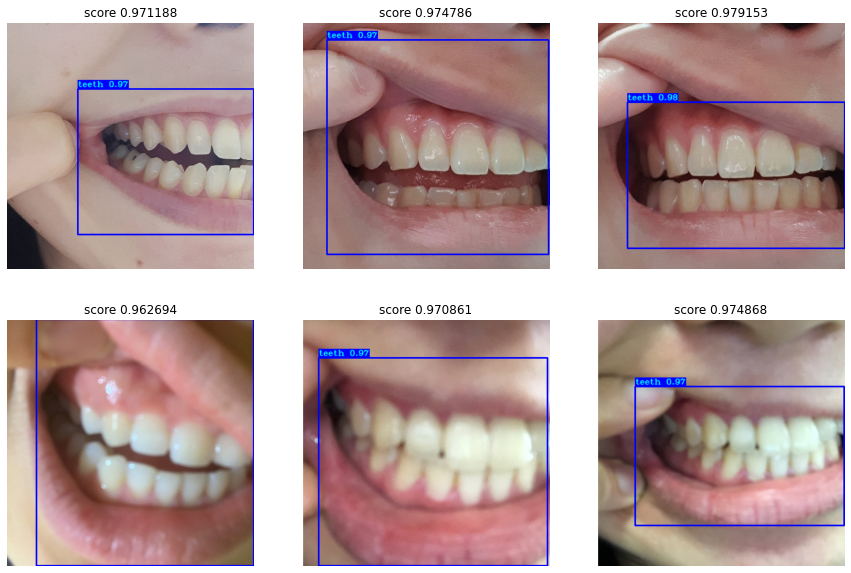

In [47]:
#train good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_good.jpg",bbox_inches = "tight")

In [48]:
#train bad 6 picture
if len(train_score_i)>6 : 
    roof = 6
else: 
    roof = len(train_score_i)
bad_case_train_sort = np.argsort([i for i in train_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[train_score_i[bad_case_train_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

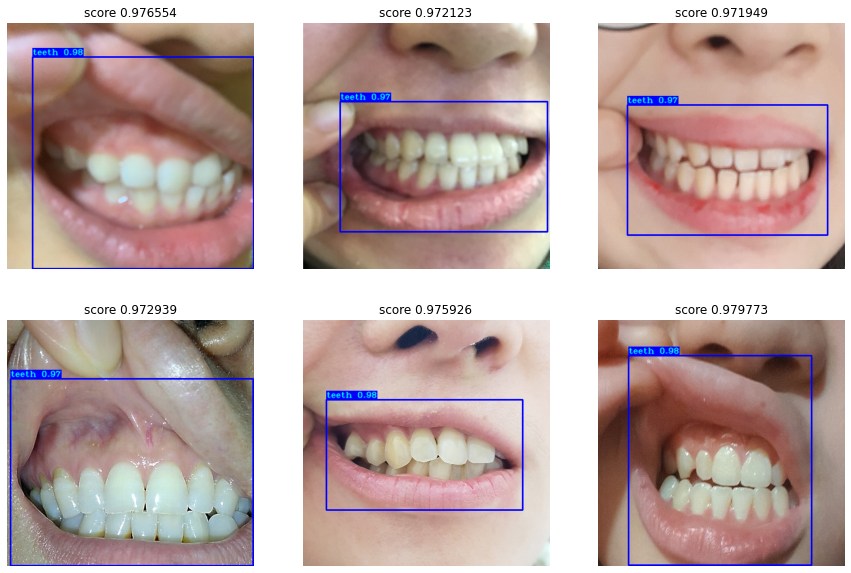

In [49]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_good.jpg",bbox_inches = "tight")

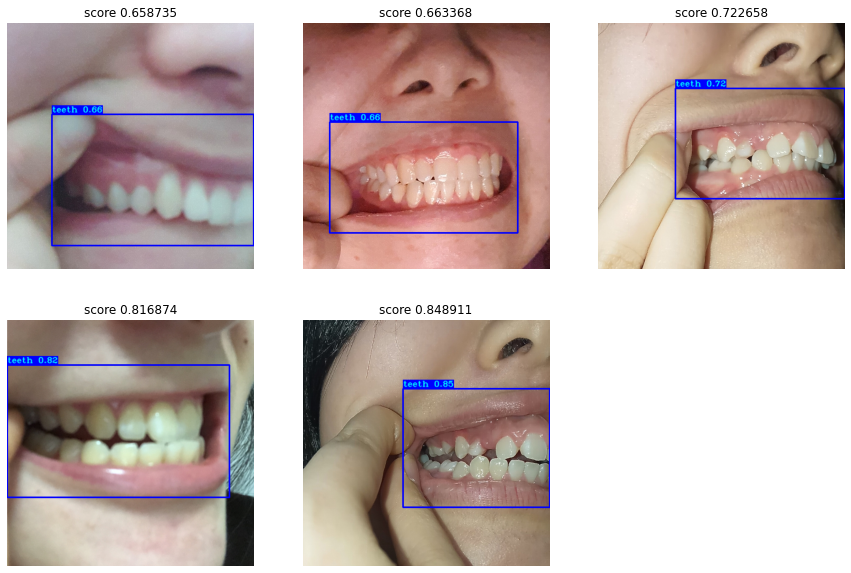

In [50]:
#test bad 6 picture
if len(valid_score_i)>6 : 
    roof = 6
else: 
    roof = len(valid_score_i)
bad_case_valid_sort = np.argsort([i for i in valid_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[valid_score_i[bad_case_valid_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_bad.jpg",bbox_inches = "tight")

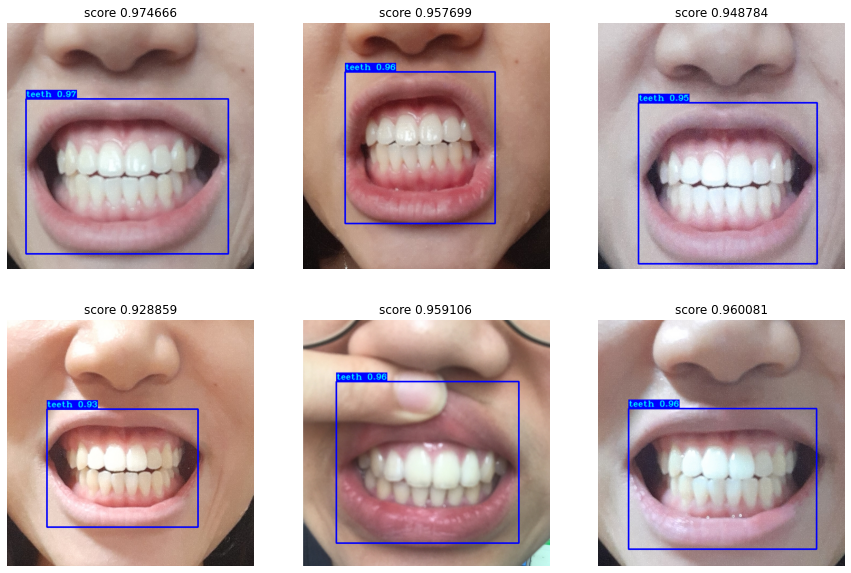

In [51]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_good.jpg",bbox_inches = "tight")

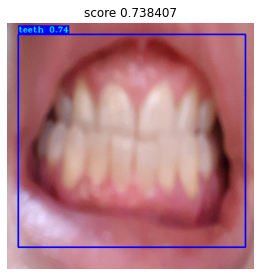

In [52]:
#test bad 6 picture
if len(test_score_i)>6 : 
    roof = 6
else: 
    roof = len(test_score_i)
bad_case_test_sort = np.argsort([i for i in test_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[test_score_i[bad_case_test_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_bad.jpg",bbox_inches = "tight")

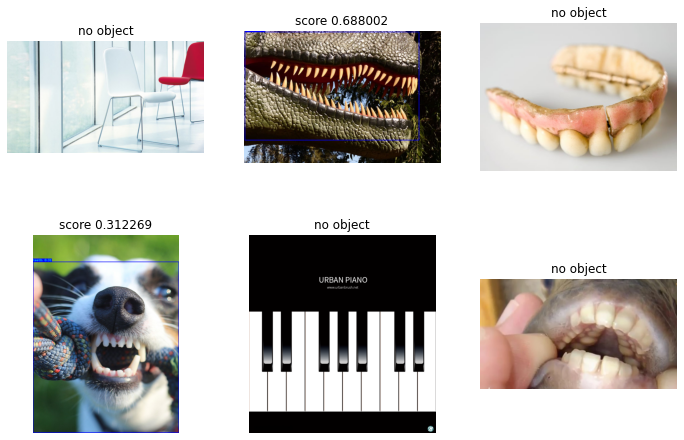

In [53]:
#anomaly
plt.figure(figsize=(12,8))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[-6:][i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/anomaly.jpg",bbox_inches = "tight")

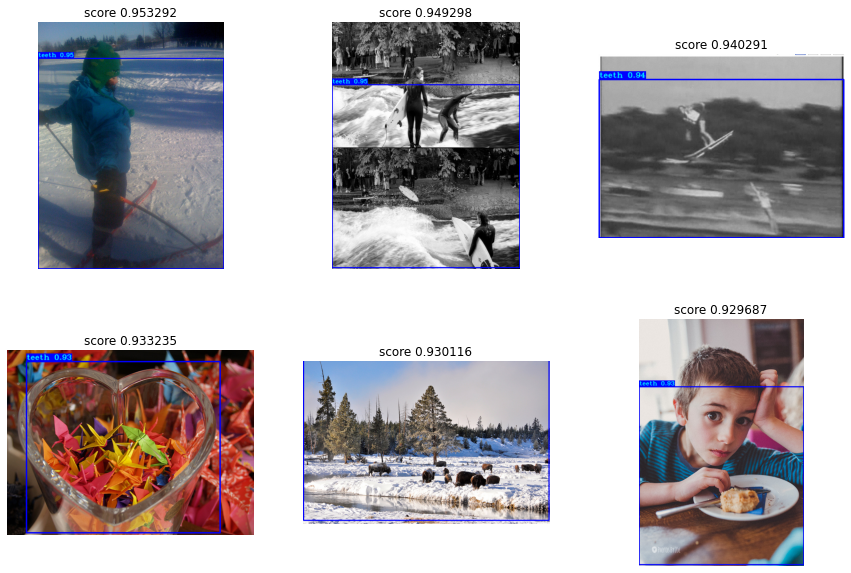

In [54]:
#coco bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_anomaly[over_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/coco_bad.jpg",bbox_inches = "tight")

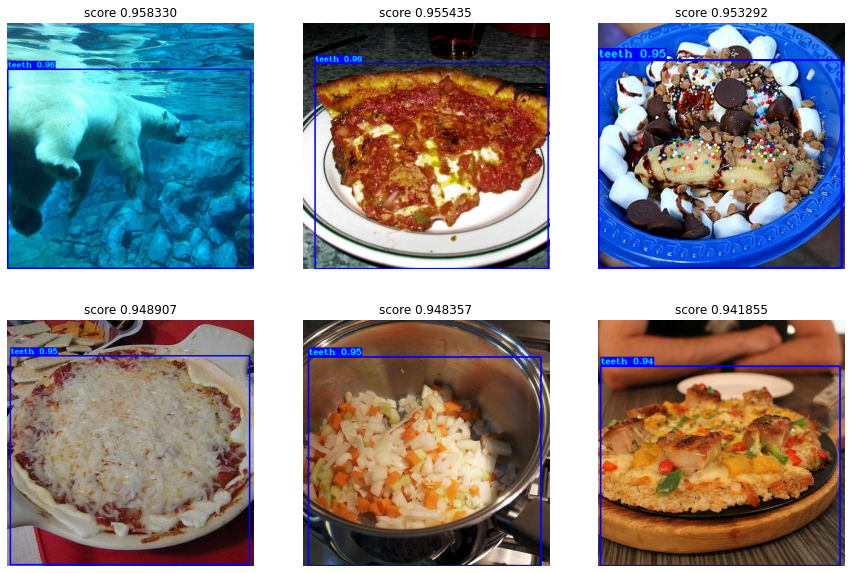

In [55]:
#coco_center bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_center_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[over_center_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/center_coco_bad.jpg",bbox_inches = "tight")

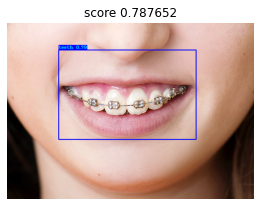

In [56]:
#braces bad 6 picture
bad_case_braces_sort_decent = np.argsort(under_braces_score)
if len(bad_case_braces_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_braces_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[under_braces_i[bad_case_braces_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/braces_bad.jpg",bbox_inches = "tight")

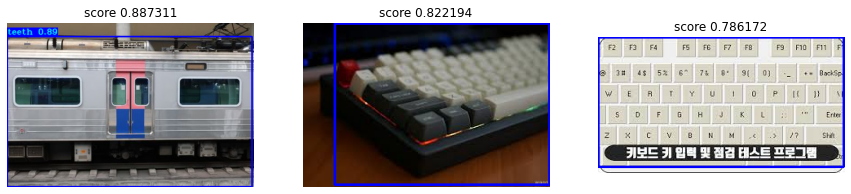

In [57]:
#angle bad 6 picture
bad_case_angle_sort_decent = np.argsort(over_angle_score)[::-1]
if len(bad_case_angle_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_angle_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[over_angle_i[bad_case_angle_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/angle_bad.jpg",bbox_inches = "tight")